In [47]:
# 20230331_beads_box15 box size 15 gradient 25000 snr 2
# 20230331_beads_box box size 31 gradient 10000 snr 3

# config = {
#     'dirname': '20230331_beads',
#     'box_size': 31,
#     'gradient': 10000,
#     'snr': 2
#     'res': 110
# }

# config = {
#     'dirname': '20230331_beads_box15px',
#     'box_size': 15,
#     'gradient': 10000,
#     'snr': 2
#     'res': 110
# }

# config = {
#     'dirname': '20230331_beads_box7',
#     'box_size': 7,
#     'gradient': 10000,
#     'snr': 2
#     'res': 110
# }

# config = {
#     'dirname': '20230601_MQ_celltype/beads_box9',
#     'box_size': 31,
#     'gradient': 1750,
#     'snr': 2.5,
#     'res': 85.7
# }

# config = {
#     'dirname': '20230601_MQ_celltype/beads',
#     'box_size': 15,
#     'gradient': 1000,
#     'snr': 1.5,
#     'res': 85.7,
# }






# EasySTORM
config = {
    'dirname': '20231020_20nm_beads_10um_range_10nm_step/all_beads/',
    'box_size': 15,
    'gradient': 1000,
    'snr': 2,
    'res': 85.7,
    'z_step': 10,
}

# config = {
#     'dirname': '20231212_miguel_openframe/stacks/',
#     'box_size': 15,
#     'gradient': 1000,
#     'snr': 2,
#     'res': 85.7,
# }

# config = {
#     'dirname': 'openframe_beads/stacks/',
#     'box_size': 15,
#     'gradient': 2500,
#     'snr': 2,
#     'res': 85.7,
# }

# Zeiss
# config = {
#     'dirname' :'20231121_nup_miguel_zeiss/stacks/',
#     'box_size': 15,
#     'gradient': 25000,
#     'snr': 2,
#     'res': 106,
# }


# FD-LOCO
# config = {
#     'dirname': 'fd-deeploc-data/Astigmatism_beads_stacks_2um',
#     'box_size': 15,
#     'gradient': 2500,
#     'snr': 1.5,
#     'res': 110,
# }

In [48]:
dirname = config['dirname']
import glob

bead_stacks = glob.glob(f'/home/miguel/Projects/data/{dirname}/**/*Default.ome.tif')
for b in bead_stacks:
    print(b)
print(len(bead_stacks))
# bead_stacks = [
#     f'/home/miguel/Projects/uni/data/smlm_3d/{dirname}/3um_stack_20nm_step_20nm_bead_3/3um_stack_20nm_step_20nm_bead_3_MMStack_Default.ome.tif',
#     f'/home/miguel/Projects/uni/data/smlm_3d/{dirname}/3um_stack_20nm_step_20nm_bead_9/3um_stack_20nm_step_20nm_bead_9_MMStack_Default.ome.tif',
#     f'/home/miguel/Projects/uni/data/smlm_3d/{dirname}/3um_stack_20nm_step_20nm_bead_7/3um_stack_20nm_step_20nm_bead_7_MMStack_Default.ome.tif',
#     f'/home/miguel/Projects/uni/data/smlm_3d/{dirname}/3um_stack_20nm_step_20nm_bead_6/3um_stack_20nm_step_20nm_bead_6_MMStack_Default.ome.tif',
#     f'/home/miguel/Projects/uni/data/smlm_3d/{dirname}/3um_stack_20nm_step_20nm_bead_2/3um_stack_20nm_step_20nm_bead_2_MMStack_Default.ome.tif',
#     f'/home/miguel/Projects/uni/data/smlm_3d/{dirname}/3um_stack_20nm_step_20nm_bead_4/3um_stack_20nm_step_20nm_bead_4_MMStack_Default.ome.tif',
#     f'/home/miguel/Projects/uni/data/smlm_3d/{dirname}/3um_stack_20nm_step_20nm_bead_8/3um_stack_20nm_step_20nm_bead_8_MMStack_Default.ome.tif',
# ]

/home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads/stacks/stack__7_MMStack_Default.ome.tif
/home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads/stacks/stack__4_MMStack_Default.ome.tif
/home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads/stacks/stack__6_MMStack_Default.ome.tif
/home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads/stacks/stack__2_MMStack_Default.ome.tif
/home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads/stacks/stack__9_MMStack_Default.ome.tif
/home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads/stacks/stack__10_MMStack_Default.ome.tif
/home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads/stacks/stack__1_MMStack_Default.ome.tif
/home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads/stacks/stack__5_MMStack_Default.ome.tif
/home/miguel/Projects/data/20231020_20nm_beads_10um_ran

In [49]:
# # # # Wipe all localisation files
# !ls /home/miguel/Projects/data/{dirname}/**/*.hdf5 | xargs rm
# !ls /home/miguel/Projects/data/{dirname}/**/*slice* | xargs rm

In [50]:
%load_ext autoreload
%autoreload 2
# Write bead stack data
import matplotlib.pyplot as plt
import os
import numpy as np
from tifffile import imread, imwrite
import sys
import h5py
import pandas as pd
from tqdm import tqdm
from skimage.feature import match_template
from typing import Dict

sys.path.append('/home/miguel/Projects/smlm_z/smlm-z/src/smlm_z/pipelines')

# from preprocessing.nodes import extract_training_stacks
from sklearn.metrics import euclidean_distances

picasso_path = '/home/miguel/anaconda3/envs/picasso/bin/picasso'

def extract_training_stacks(spots: np.array, bead_stack: np.array, parameters: Dict) -> np.array:
    picasso_params = parameters['picasso']
    spot_size = picasso_params['spot_size']
    frame_idx = picasso_params['localised_frame']
    frame = bead_stack[frame_idx]
    stacks = []
    if parameters['DEBUG']:
        spots = spots[0:3]
    for spot in spots:
        res = match_template(frame, spot)
        i, j = np.unravel_index(np.argmax(res), res.shape)
        stack = bead_stack[:, i:i+spot_size, j:j+spot_size]
        stacks.append(stack)
    return np.array(stacks)
    
out_stack_path = []

all_spots = []
all_locs = []
all_stacks = []

for bead_stack_path in tqdm(bead_stacks):
    bname = os.path.basename(bead_stack_path)

    bead_stack = imread(bead_stack_path)

    im_slice = bead_stack[bead_stack.shape[0]//2]
    slice_path = bead_stack_path.replace('.ome', '_slice.ome')
    if not os.path.exists(slice_path):
        plt.imshow(im_slice)
        plt.show()
        imwrite(slice_path, im_slice.astype(np.uint16))
    

    spots_path = slice_path.replace('.ome.tif', '.ome_spots.hdf5')
    locs_path = slice_path.replace('.ome.tif', '.ome_locs.hdf5')
    print(f"{picasso_path} localize -b {config['box_size']} -d 0 -g {config['gradient']} -px {int(config['res'])} {slice_path}")

    if not os.path.exists(spots_path) or not os.path.exists(locs_path):
        print('Running picasso')
        # Run picasso on bead stack
        !{picasso_path} localize -b {config['box_size']} -d 0 -g {config['gradient']} -px {int(config['res'])} {slice_path}
            
    with h5py.File(spots_path) as f:
        spots = np.array(f['spots'])

    locs = pd.read_hdf(locs_path, key='locs')
    locs['fname'] = bname
    coords = locs[['x', 'y']].to_numpy()
    dists = euclidean_distances(coords, coords)
    np.fill_diagonal(dists, np.inf)
    min_dists = dists.min(axis=1)
    
    error_margin = 0.8
    min_seperation = (np.sqrt(2)  * config['box_size']) * error_margin
    idx = np.argwhere(min_dists > min_seperation).squeeze()
    print(len(idx) / len(min_dists))
    print(len(idx), locs.shape)
    locs = locs.iloc[idx]
    spots = spots[idx]

    
    
    parameters = {
        'picasso': {
            'spot_size': config['box_size'],
            'localised_frame': bead_stack.shape[0]//2
        },
        'DEBUG': False
    }
    stacks = extract_training_stacks(spots, bead_stack, parameters)
    
    all_spots.append(spots)
    all_locs.append(locs)
    all_stacks.append(stacks)

min_stack_length = min(list(map(lambda s: s.shape[1], all_stacks)))
all_stacks = [s[:, :min_stack_length] for s in all_stacks]
all_spots = np.concatenate(all_spots)
all_locs = pd.concat(all_locs)
all_stacks = np.concatenate(all_stacks)

print(all_spots.shape)
print(all_locs.shape)
print(all_stacks.shape)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


  0%|                                                                                          | 0/10 [00:00<?, ?it/s]

/home/miguel/anaconda3/envs/picasso/bin/picasso localize -b 15 -d 0 -g 1000 -px 85 /home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads/stacks/stack__7_MMStack_Default_slice.ome.tif
0.9378238341968912
181 (193, 13)


 10%|████████▏                                                                         | 1/10 [00:15<02:17, 15.29s/it]

/home/miguel/anaconda3/envs/picasso/bin/picasso localize -b 15 -d 0 -g 1000 -px 85 /home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads/stacks/stack__4_MMStack_Default_slice.ome.tif
0.9342105263157895
142 (152, 13)


 20%|████████████████▍                                                                 | 2/10 [00:27<01:47, 13.41s/it]

/home/miguel/anaconda3/envs/picasso/bin/picasso localize -b 15 -d 0 -g 1000 -px 85 /home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads/stacks/stack__6_MMStack_Default_slice.ome.tif
0.9166666666666666
121 (132, 13)


 30%|████████████████████████▌                                                         | 3/10 [00:38<01:25, 12.23s/it]

/home/miguel/anaconda3/envs/picasso/bin/picasso localize -b 15 -d 0 -g 1000 -px 85 /home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads/stacks/stack__2_MMStack_Default_slice.ome.tif
1.0
135 (135, 13)


 40%|████████████████████████████████▊                                                 | 4/10 [00:50<01:12, 12.15s/it]

/home/miguel/anaconda3/envs/picasso/bin/picasso localize -b 15 -d 0 -g 1000 -px 85 /home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads/stacks/stack__9_MMStack_Default_slice.ome.tif
0.949685534591195
151 (159, 13)


 50%|█████████████████████████████████████████                                         | 5/10 [01:03<01:03, 12.63s/it]

/home/miguel/anaconda3/envs/picasso/bin/picasso localize -b 15 -d 0 -g 1000 -px 85 /home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads/stacks/stack__10_MMStack_Default_slice.ome.tif
0.9743589743589743
152 (156, 13)


 60%|█████████████████████████████████████████████████▏                                | 6/10 [01:17<00:52, 13.00s/it]

/home/miguel/anaconda3/envs/picasso/bin/picasso localize -b 15 -d 0 -g 1000 -px 85 /home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads/stacks/stack__1_MMStack_Default_slice.ome.tif
0.930379746835443
147 (158, 13)


 70%|█████████████████████████████████████████████████████████▍                        | 7/10 [01:30<00:39, 13.03s/it]

/home/miguel/anaconda3/envs/picasso/bin/picasso localize -b 15 -d 0 -g 1000 -px 85 /home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads/stacks/stack__5_MMStack_Default_slice.ome.tif
0.9408284023668639
159 (169, 13)


 80%|█████████████████████████████████████████████████████████████████▌                | 8/10 [01:44<00:26, 13.38s/it]

/home/miguel/anaconda3/envs/picasso/bin/picasso localize -b 15 -d 0 -g 1000 -px 85 /home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads/stacks/stack__8_MMStack_Default_slice.ome.tif
0.9644970414201184
163 (169, 13)


 90%|█████████████████████████████████████████████████████████████████████████▊        | 9/10 [01:59<00:13, 13.75s/it]

/home/miguel/anaconda3/envs/picasso/bin/picasso localize -b 15 -d 0 -g 1000 -px 85 /home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads/stacks/stack__3_MMStack_Default_slice.ome.tif
0.9538461538461539
124 (130, 13)


100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [02:10<00:00, 13.04s/it]

(1475, 15, 15)
(1475, 13)
(1475, 1001, 15, 15)


In [51]:
all_locs.sort_values('x')

,frame,x,y,photons,sx,sy,bg,lpx,lpy,net_gradient,likelihood,iterations,fname
0,0,8.491385,735.969238,5295.233887,2.027887,2.027887,344.765656,0.082300,0.082300,6218.621582,-133.051270,28,stack__3_MMStack_Default.ome.tif
0,0,10.568525,374.104767,4433.445312,4.215060,4.215060,311.003510,0.391075,0.388343,2303.324951,-136.521973,1000,stack__2_MMStack_Default.ome.tif
0,0,10.753319,279.037506,2786.123047,1.809456,1.809456,312.652771,0.116049,0.116049,3505.441162,-106.918579,20,stack__4_MMStack_Default.ome.tif
0,0,13.071928,828.682861,2912.869873,2.641339,2.641339,327.527954,0.229728,0.229474,2027.480591,-100.243896,14,stack__10_MMStack_Default.ome.tif
0,0,13.167913,792.247253,6843.977051,2.401099,2.401099,328.822876,0.086500,0.086470,5381.320312,-116.261230,4,stack__8_MMStack_Default.ome.tif
...,...,...,...,...,...,...,...,...,...,...,...,...,...
150,0,1282.187256,615.159912,8298.931641,1.723000,1.723000,349.119843,0.042180,0.042180,11360.055664,-103.489746,10,stack__4_MMStack_Default.ome.tif
129,0,1283.809937,1086.965698,2688.335449,1.842513,1.842513,322.337006,0.125606,0.125606,3268.272705,-108.732544,14,stack__3_MMStack_Default.ome.tif
158,0,1284.856079,229.970413,5374.212891,4.209864,4.209864,303.942291,0.317807,0.317644,2594.121582,-136.155762,8,stack__9_MMStack_Default.ome.tif
168,0,1288.886963,616.101379,5840.495605,1.531815,1.531815,359.367188,0.047336,0.047336,10317.154297,-140.450439,22,stack__5_MMStack_Default.ome.tif


1.219753086419753 7.303854875283447


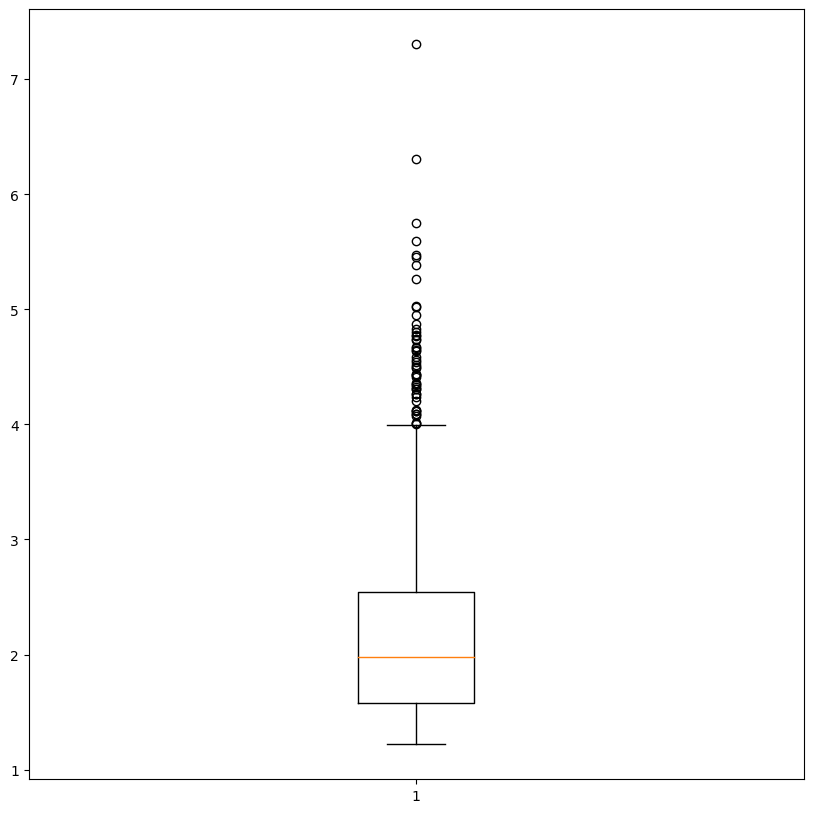

(721, 15, 15)
(721, 13)
(721, 1001, 15, 15)


In [72]:
def snr(psf):
    return psf.max() / np.median(psf)

snrs = np.array([snr(psf) for psf in all_stacks])
print(min(snrs), max(snrs))
plt.boxplot(snrs)
plt.show()
min_snrs = config['snr']

idx = np.argwhere(snrs > min_snrs).squeeze()
spots = all_spots[idx]
locs = all_locs.iloc[idx]
stacks = all_stacks[idx]

print(spots.shape)
print(locs.shape)
print(stacks.shape)

In [73]:
min(snrs[idx])

2.002557544757033

In [21]:
# import seaborn as sns
# zs = (np.arange(0, stacks.shape[1]) * 20)
# # zs = np.repeat(zs, stacks.shape[0], axis=0)

# from sklearn.decomposition import PCA


# stacks_flat = np.concatenate(stacks)
# # zs = zs.reshape((stacks_flat.shape[0], -1)).squeeze()
# stacks_flat = stacks_flat.reshape((stacks_flat.shape[0], -1))


# pca_func = PCA().fit(stacks_flat)

# for stack in stacks:
#     pca = pca_func.transform(stack.reshape(stack.shape[0], -1))
#     sns.scatterplot(x=pca[:, 0], y=pca[:, 1], hue=zs)
# plt.legend([],[], frameon=False)
# plt.show()



(721, 1001, 15, 15)


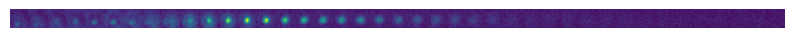

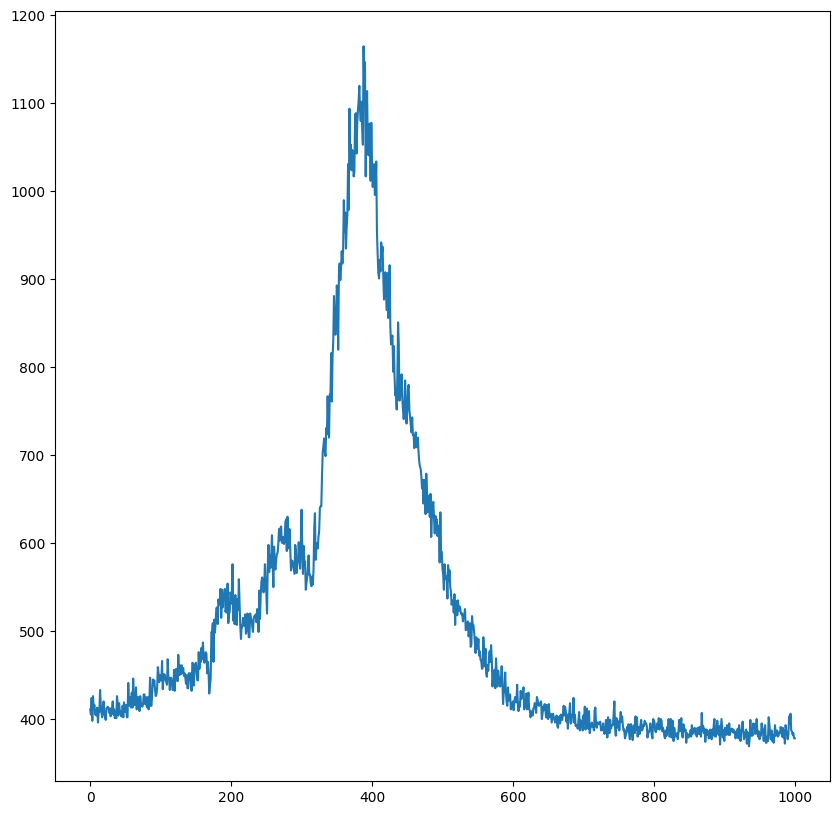

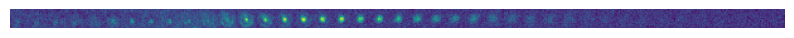

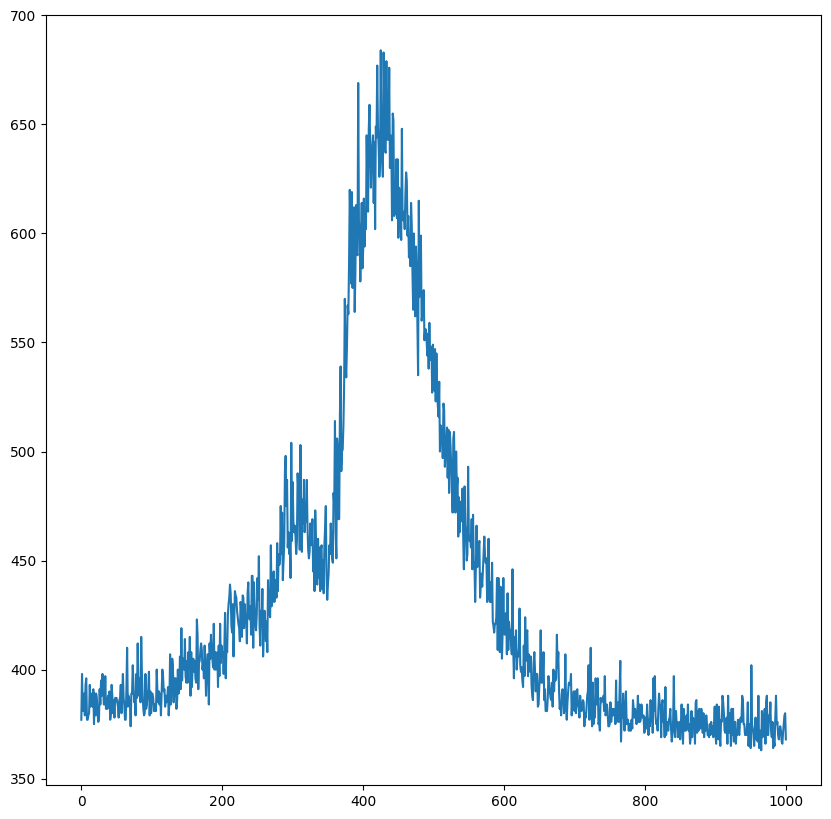

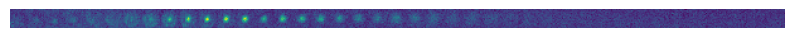

...

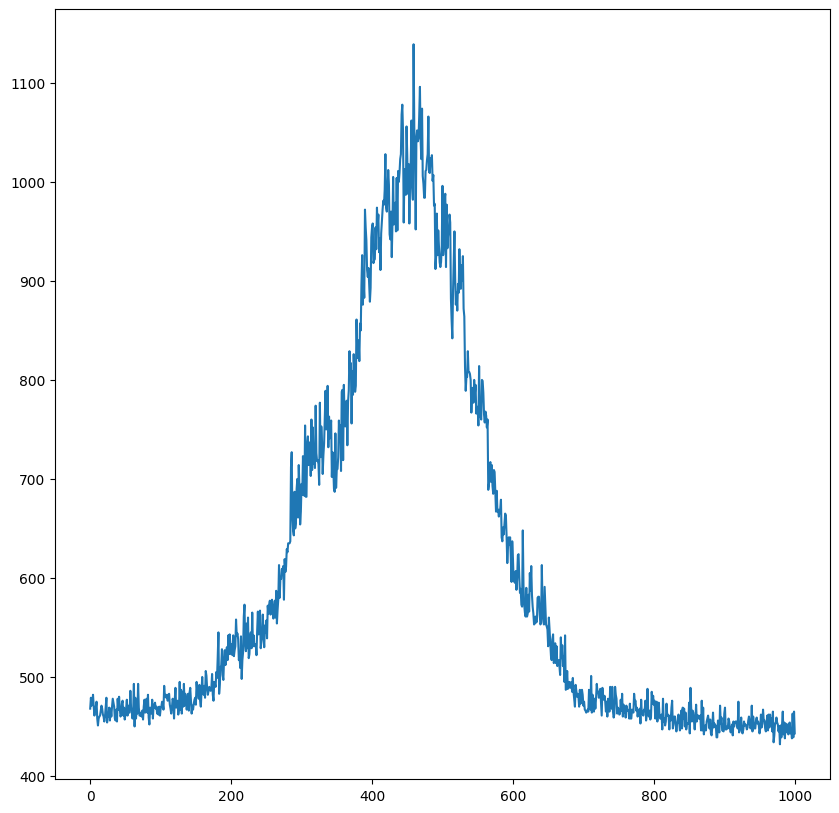

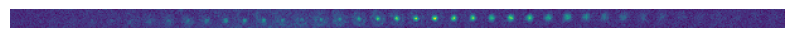

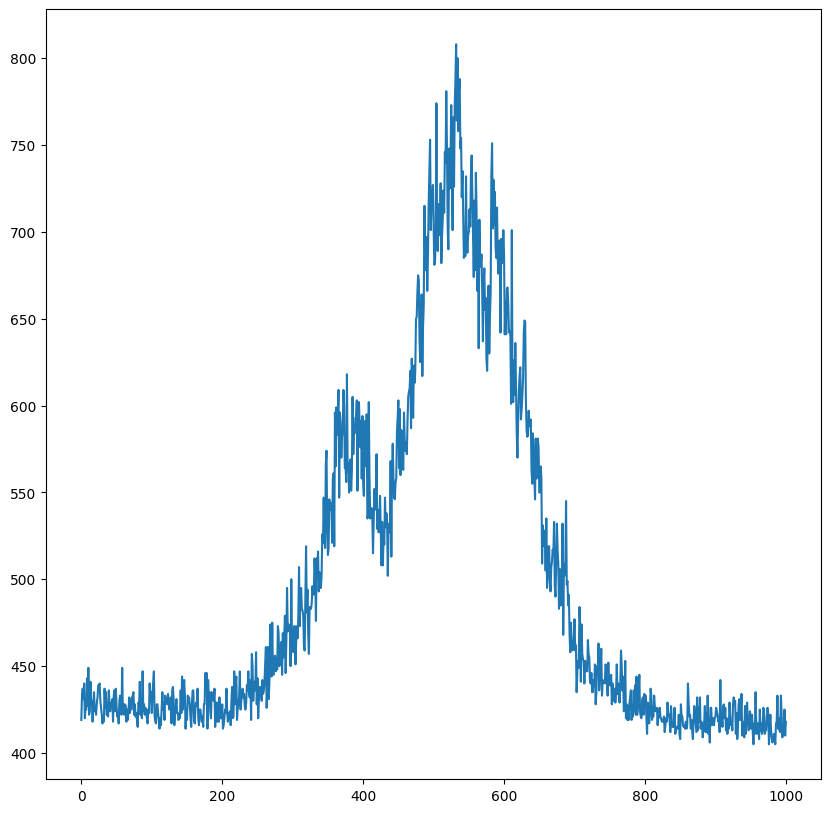

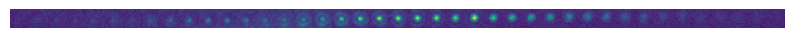

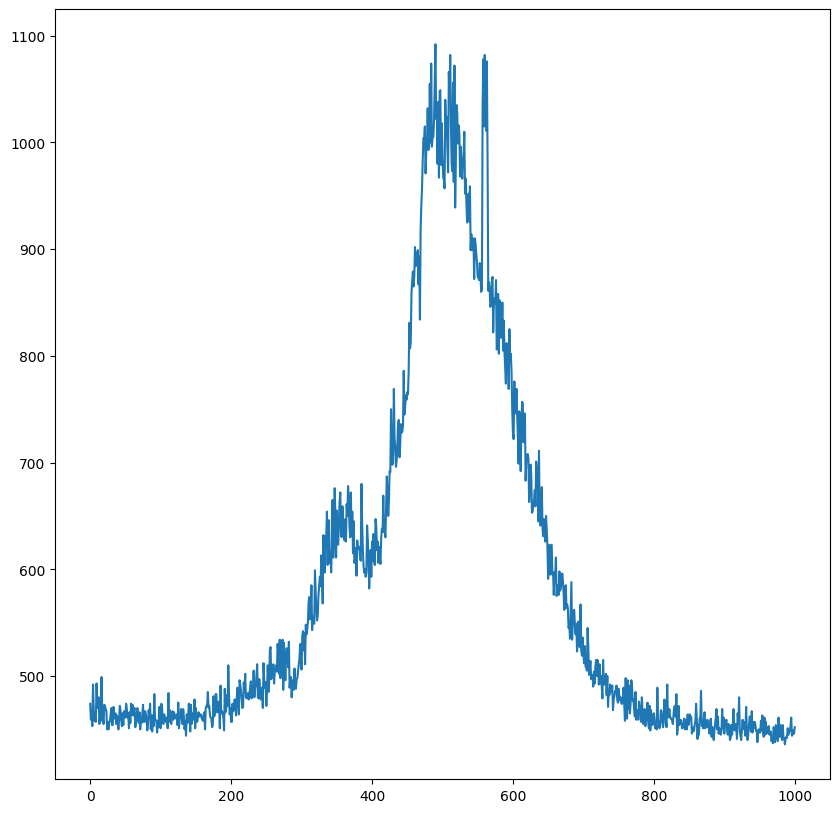

In [54]:
from data.visualise import grid_psfs, show_psf_axial
import seaborn as sns

# sns.scatterplot(data=locs, x='x', y='y')
# plt.show()
plt.rcParams['figure.figsize'] = [10, 10]
print(stacks.shape)
for psf in stacks[:200]:
    show_psf_axial(psf, '', 15)
    plt.plot(psf.max(axis=(1,2)))
    plt.show()

In [7]:
# Skew gaussian peak finding
plt.rcParams['figure.figsize'] = [10, 3]

from scipy.optimize import curve_fit
from scipy.stats import norm
from skimage.filters import gaussian

def skew(x, s, e=0, w=1, a=0, c=0):
    t = (x - e) / w
    return (s * norm.pdf(t) * norm.cdf(a * t)) + c


def fit_gaussian(x, y):
    mean = np.argmax(y)
    peak = np.max(y)
    min_val = np.min(y)
    bounds = [
        (0, peak * 10),
        (np.percentile(x, 25), np.percentile(x, 75)),
        (0, max(x)),
        (-10, 10),
        (0, np.max(y))
    ]
    low_bounds, high_bounds = zip(*bounds)

    p0 = [max(y), np.mean(x), np.std(x), 0, np.mean(y)]
    popt, _ = curve_fit(skew, x, y, p0=p0, bounds=(low_bounds, high_bounds),
                        maxfev=10000)
    return lambda x: skew(x, *popt)

def find_peak(psf):
    y = gaussian(psf).max(axis=(1,2))
    zs = np.arange(psf.shape[0]) * args['z_step']
    high_res_z = np.linspace(zs.min(), zs.max(), 10000)
    high_res_fit = fit_gaussian(zs, y)(high_res_z)
    
    offset = high_res_z[np.argmax(high_res_fit)]
    # show_psf_axial(psf)
    # plt.plot(zs, y, label='raw')
    # plt.plot(high_res_z, high_res_fit, label='fit')
    # plt.legend()
    # plt.show()
    return offset
    
# offsets = np.array([find_peak(psf) for psf in tqdm(stacks)])
# locs['offset'] = offsets

100%|███████████████████████████████████████████████████████████████████████████████| 481/481 [00:09<00:00, 49.88it/s]


In [55]:
from skimage.filters import butterworth

def has_fwhm(psf, debug=True):
    y = np.max(gaussian(psf), axis=(1,2))
    max_val = np.max(y)
    min_val = np.min(y)
    half_max = min_val + ((max_val-min_val) / 2)
    crossCount = np.sum((y[:-1]>half_max) != (y[1:]>half_max))
    if debug and crossCount < 2:
        show_psf_axial(psf)
        plt.plot(y, label='raw')
        plt.plot([0, len(y)], [half_max, half_max])
        plt.show()
    return crossCount >= 2

valid_idx = np.argwhere([has_fwhm(butterworth(psf, cutoff_frequency_ratio=0.2, high_pass=False)) for psf in stacks]).squeeze()

stacks = stacks[valid_idx]

locs = locs.iloc[valid_idx]

In [56]:
i = 66
psf = stacks[i]
has_fwhm(psf, debug=True)

True

In [62]:
# locs = pd.concat((locs, locs))
# stacks = np.concatenate((stacks, stacks))

# print(locs.shape)
# print(stacks.shape)

(1442, 13)
(1442, 1001, 15, 15)


In [68]:
outpath = f"/home/miguel/Projects/data/{config['dirname']}/combined"
os.makedirs(outpath, exist_ok=True)

out_locs = os.path.join(outpath, 'locs.hdf')
out_stacks = os.path.join(outpath, 'stacks.ome.tif')


In [69]:
print(out_locs)
print(out_stacks)

/home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads//combined/locs.hdf
/home/miguel/Projects/data/20231020_20nm_beads_10um_range_10nm_step/all_beads//combined/stacks.ome.tif


In [70]:
print(stacks.shape)
imwrite(out_stacks, stacks)

print(locs.shape)
locs.to_hdf(out_locs, key='locs')

(1442, 1001, 15, 15)
(1442, 13)


In [ ]:
import yaml
yaml_config = {
    'training_stacks': {
        'type': 'smlm_z.extras.datasets.TiffDataSet',
        'filepath': out_stacks,
    },
    'locs': {
        'type': 'pandas.HDFDataSet',
        'filepath': out_locs,
        'key': 'locs'
    },
}
for k, v in yaml_config.items():
    try:
        assert os.path.exists(v['filepath'])
    except AssertionError as e:
        print(v['filepath'], 'does not exist')
        break

import sys
yaml.dump(yaml_config, sys.stdout)

In [ ]:
imgs = stacks[0]
print(imgs.shape)